In [2]:

from requests import get
from requests.exceptions import RequestException
from contextlib import closing
from bs4 import BeautifulSoup



In [3]:

def simple_get(url):
    """
    Attempts to get the content at `url` by making an HTTP GET request.
    If the content-type of response is some kind of HTML/XML, return the
    text content, otherwise return None.
    """
    try:
        with closing(get(url, stream=True)) as resp:
            if is_good_response(resp):
                return resp.content
            else:
                return None

    except RequestException as e:
        log_error('Error during requests to {0} : {1}'.format(url, str(e)))
        return None

def is_good_response(resp):
    """
    Returns True if the response seems to be HTML, False otherwise.
    """
    content_type = resp.headers['Content-Type'].lower()
    return (resp.status_code == 200 
            and content_type is not None 
            and content_type.find('html') > -1)


def log_error(e):
    """
    It is always a good idea to log errors. 
    This function just prints them, but you can
    make it do anything.
    """
    print(e)
    

In [4]:
strava_profile = simple_get("https://www.worldometers.info/coronavirus/")

len(strava_profile)

html = BeautifulSoup(strava_profile, 'html.parser')


[<div class="navbar navbar-default">
 <div class="container">
 <div class="navbar-header">
 <div class="logo"><a class="navbar-brand" href="/"><img border="0" src="/img/worldometers-logo.gif" title="Worldometer"/></a></div>
 <button class="navbar-toggle" data-target="#navbar-main" data-toggle="collapse" type="button">
 <span class="icon-bar"></span>
 <span class="icon-bar"></span>
 <span class="icon-bar"></span>
 </button>
 </div>
 <div class="navbar-collapse collapse" id="navbar-main">
 <ul class="nav navbar-nav">
 <li><a href="/coronavirus/"><span style="color:#FF9900; font-weight:bold">Coronavirus</span></a></li>
 <li><a href="/population/">Population</a></li>
 </ul>
 </div>
 </div>
 </div>, <div class="container">
 <div class="navbar-header">
 <div class="logo"><a class="navbar-brand" href="/"><img border="0" src="/img/worldometers-logo.gif" title="Worldometer"/></a></div>
 <button class="navbar-toggle" data-target="#navbar-main" data-toggle="collapse" type="button">
 <span class="
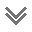
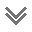
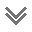
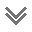
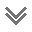
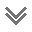

In [5]:
html.find_all('div')

0 <div class="navbar navbar-default">
<div class="container">
<div class="navbar-header">
<div class="logo"><a class="navbar-brand" href="/"><img border="0" src="/img/worldometers-logo.gif" title="Worldometer"/></a></div>
<button class="navbar-toggle" data-target="#navbar-main" data-toggle="collapse" type="button">
<span class="icon-bar"></span>
<span class="icon-bar"></span>
<span class="icon-bar"></span>
</button>
</div>
<div class="navbar-collapse collapse" id="navbar-main">
<ul class="nav navbar-nav">
<li><a href="/coronavirus/"><span style="color:#FF9900; font-weight:bold">Coronavirus</span></a></li>
<li><a href="/population/">Population</a></li>
</ul>
</div>
</div>
</div>
1 <div class="container">
<div class="navbar-header">
<div class="logo"><a class="navbar-brand" href="/"><img border="0" src="/img/worldometers-logo.gif" title="Worldometer"/></a></div>
<button class="navbar-toggle" data-target="#navbar-main" data-toggle="collapse" type="button">
<span class="icon-bar"></span>
<
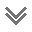

82 <div class="row">
<div class="col-md-8">
<h3 id="countries">Confirmed Cases and Deaths by Country, Territory, or Conveyance</h3>
<p>The <strong>coronavirus</strong> COVID-19 is affecting
<strong>209 countries and territories</strong> around the world and 2 international conveyances. <strong>The day is reset after midnight GMT+0</strong>.
<p><br>
<script src="https://cdnjs.cloudflare.com/ajax/libs/moment.js/2.8.4/moment.min.js"></script>
<script src="https://cdn.datatables.net/plug-ins/1.10.20/sorting/datetime-moment.js"></script>
<div style="margin-bottom:30px">
<a href="/report_us/" style="text-decoration: underline;"><strong>Report coronavirus cases</strong></a>
</div>
<script>
    var tabs = ["today","yesterday"];
    $(document).ready(function() {

      // $.fn.dataTable.moment('MMM DD');
        tabs.forEach(function(val) {


            $('#nav-' + val + '-tab a').click(function(e) {
                e.preventDefault();
                $(this).tab('show');
            })

    

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [6]:
for i, d in enumerate(html.find_all("div")):
    print(i, d)